In [4]:
from cryptocmd import CmcScraper
import pandas as pd
import seaborn as sns
import plotly.express as px
from copy import copy
import matplotlib.pyplot as plt
import numpy as np
import plotly.figure_factory as ff
import plotly.graph_objects as go



# <b>Data wrangling </b>

In [5]:
headers = ['Date', 'ADA', 'AVAX', 'BNB', 'BTC', 'DOT', 'ETH', 'LINK', 'LTC', 'MATIC', 'SOL', 'XRP']
crypto_df = pd.DataFrame(columns = headers)
btc_scraper = CmcScraper('BTC', all_time=True)
btc_raw_df = btc_scraper.get_dataframe()

#since BTC has the longest all time data, using it's Date column as a pivot for other coins columns
crypto_df['Date'] = btc_raw_df['Date']
crypto_df['BTC'] = btc_raw_df['Close']

for x in headers[1:]:
    scaper = CmcScraper(x, all_time=True)
    scaper_df = scaper.get_dataframe()
    crypto_df[x] = scaper_df['Close']
    crypto_df.fillna(0, inplace=True)

#since the dataframe is descending order w.r.t to Date, we are reversing the dataframe and reseting the index.
cleansed_crypto_df =  crypto_df.iloc[::-1].reset_index(drop=True)
cleansed_crypto_df



,Date,ADA,AVAX,BNB,BTC,DOT,ETH,LINK,LTC,MATIC,SOL,XRP
0,2013-04-28,0.000000,0.000000,0.000000,134.210007,0.000000,0.000000,0.000000,4.348400,0.000000,0.000000,0.000000
1,2013-04-29,0.000000,0.000000,0.000000,144.539993,0.000000,0.000000,0.000000,4.383900,0.000000,0.000000,0.000000
2,2013-04-30,0.000000,0.000000,0.000000,139.000000,0.000000,0.000000,0.000000,4.296490,0.000000,0.000000,0.000000
3,2013-05-01,0.000000,0.000000,0.000000,116.989998,0.000000,0.000000,0.000000,3.801010,0.000000,0.000000,0.000000
4,2013-05-02,0.000000,0.000000,0.000000,105.209999,0.000000,0.000000,0.000000,3.371980,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
3437,2022-09-25,0.446188,17.331230,274.061244,18802.097976,6.201147,1294.216774,7.865859,52.632001,0.740189,32.335360,0.492627
3438,2022-09-26,0.446757,17.542062,275.927850,19222.672184,6.550902,1335.320244,7.928507,53.432065,0.754754,33.880553,0.467678
3439,2022-09-27,0.441890,17.307691,272.401543,19110.546551,6.384196,1330.127702,8.074233,52.737259,0.740406,32.750129,0.448776
3440,2022-09-28,0.437290,17.257487,281.781207,19426.721332,6.393946,1337.410867,7.814182,53.308425,0.747373,33.235439,0.450672


In [6]:
cleansed_crypto_df.describe()

,ADA,AVAX,BNB,BTC,DOT,ETH,LINK,LTC,MATIC,SOL,XRP
count,3442.000000,3442.000000,3442.000000,3442.000000,3442.000000,3442.000000,3442.000000,3442.000000,3442.000000,3442.000000,3442.000000
mean,0.258654,8.466052,72.596854,10889.764090,4.341368,598.301438,4.739718,58.596730,0.207475,14.203269,0.291038
std,0.523248,22.108700,150.322585,15765.086592,10.055438,1033.107852,8.901273,66.541200,0.506339,40.157767,0.368892
min,0.000000,0.000000,0.000000,68.431000,0.000000,0.000000,0.000000,1.157010,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,465.505013,0.000000,0.723459,0.000000,3.889785,0.000000,0.000000,0.007575
50%,0.033406,0.000000,5.341796,4197.185059,0.000000,162.665673,0.248838,43.613474,0.000000,0.000000,0.212043
75%,0.154120,0.000000,24.516538,10888.417138,0.000000,480.358815,4.153917,82.291090,0.019299,0.626706,0.401703
max,2.968239,134.531030,675.684077,67566.830088,53.881732,4812.087614,52.198697,386.450779,2.876757,258.934312,3.377810


## <b> Function to normalize the dataframe </b>

In [33]:
def normalize(dataframe):
    df = dataframe.copy()
    for i in df.columns[1:]:
        first_non_zero_index = df[i].to_numpy().nonzero()
        df[i] = df[i]/df[i][first_non_zero_index[0][0]]
        df.fillna(0, inplace=True)
    return df

In [34]:
normalize(cleansed_crypto_df)

,Date,ADA,AVAX,BNB,BTC,DOT,ETH,LINK,LTC,MATIC,SOL,XRP
0,2013-04-28,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
1,2013-04-29,0.000000,0.000000,0.000000,1.076969,0.000000,0.000000,0.000000,1.008164,0.000000,0.000000,0.000000
2,2013-04-30,0.000000,0.000000,0.000000,1.035690,0.000000,0.000000,0.000000,0.988062,0.000000,0.000000,0.000000
3,2013-05-01,0.000000,0.000000,0.000000,0.871694,0.000000,0.000000,0.000000,0.874117,0.000000,0.000000,0.000000
4,2013-05-02,0.000000,0.000000,0.000000,0.783921,0.000000,0.000000,0.000000,0.775453,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
3437,2022-09-25,17.869309,3.539662,2588.658183,140.094606,2.138267,466.868958,41.582000,12.103762,167.412506,33.999501,83.753952
3438,2022-09-26,17.892089,3.582722,2606.289293,143.228308,2.258869,481.696407,41.913181,12.287753,170.706800,35.624217,79.512190
3439,2022-09-27,17.697204,3.534855,2572.981391,142.392859,2.201386,479.823277,42.683547,12.127968,167.461755,34.435616,76.298607
3440,2022-09-28,17.512975,3.524602,2661.577449,144.748680,2.204748,482.450567,41.308816,12.259319,169.037356,34.945902,76.620845


## <b>Interactive plotting</b>

In [38]:
def interactive_plot(dataframe, title):
    fig = px.line(title=title)
    for i in dataframe.columns[1:]:
        fig.add_scatter(x = dataframe['Date'], y = dataframe[i], name = i)
    fig.show()
        
        

In [40]:
interactive_plot(cleansed_crypto_df, 'price')
interactive_plot(normalize(cleansed_crypto_df), 'Normalized price')

### <b>Daily return</b>

In [35]:
def daily_return(dataframe):
    df_daily_return = dataframe.copy()
    for i in dataframe.columns[1:]:
        for j in range(1, len(dataframe)):
            if dataframe[i][j-1] != 0:
                df_daily_return[i][j] = ((dataframe[i][j] - dataframe[i][j-1]) / dataframe[i][j-1]) * 100
    
    return df_daily_return

In [36]:
#TODO fix inf, NaN issues

cryptos_daily_return = daily_return(cleansed_crypto_df)
cryptos_daily_return.fillna(0, inplace=True)
cryptos_daily_return

,Date,ADA,AVAX,BNB,BTC,DOT,ETH,LINK,LTC,MATIC,SOL,XRP
0,2013-04-28,0.000000,0.000000,0.000000,134.210007,0.000000,0.000000,0.000000,4.348400,0.000000,0.000000,0.000000
1,2013-04-29,0.000000,0.000000,0.000000,7.696883,0.000000,0.000000,0.000000,0.816393,0.000000,0.000000,0.000000
2,2013-04-30,0.000000,0.000000,0.000000,-3.832845,0.000000,0.000000,0.000000,-1.993886,0.000000,0.000000,0.000000
3,2013-05-01,0.000000,0.000000,0.000000,-15.834534,0.000000,0.000000,0.000000,-11.532211,0.000000,0.000000,0.000000
4,2013-05-02,0.000000,0.000000,0.000000,-10.069236,0.000000,0.000000,0.000000,-11.287262,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
3437,2022-09-25,-1.198417,-1.658945,-0.390405,-0.712431,-1.229381,-1.803990,2.997172,-1.657901,-1.852697,-3.368804,0.800281
3438,2022-09-26,0.127482,1.216490,0.681091,2.236847,5.640164,3.175934,0.796451,1.520109,1.967770,4.778648,-5.064551
3439,2022-09-27,-1.089227,-1.336055,-1.277982,-0.583299,-2.544771,-0.388861,1.838004,-1.300354,-1.900946,-3.336498,-4.041623
3440,2022-09-28,-1.041003,-0.290065,3.443323,1.654452,0.152708,0.547554,-3.220751,1.083041,0.940872,1.481856,0.422339


In [41]:
interactive_plot(cryptos_daily_return, 'Daily Retuns')


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pandas/plotting/_matplotlib/core.py:1114: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



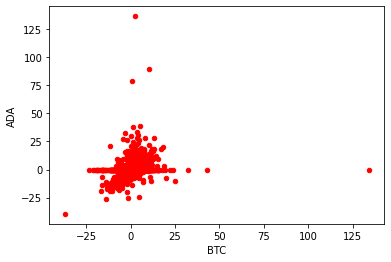

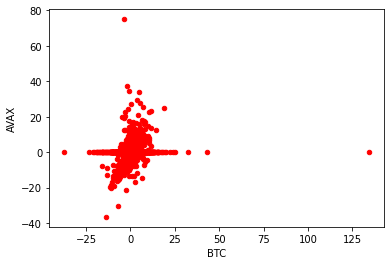

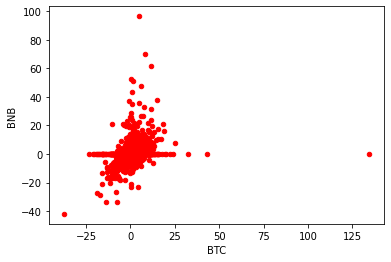

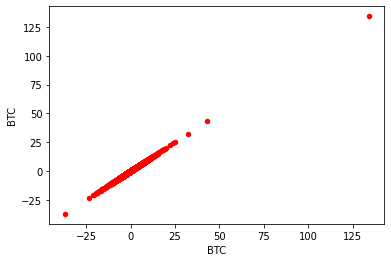

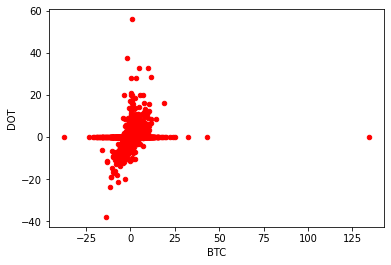

...

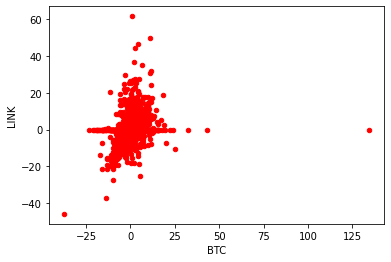

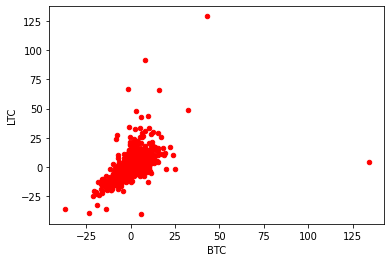

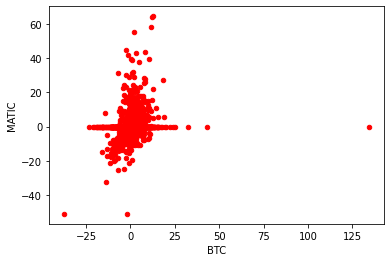

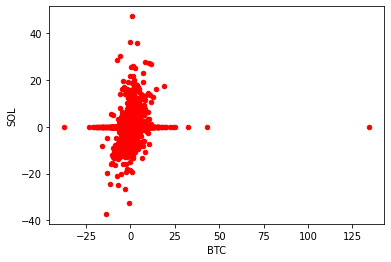

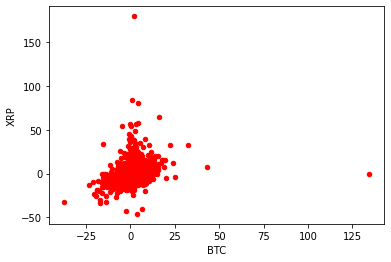

In [47]:
for i in headers[1:]:
    cryptos_daily_return.plot(kind='scatter', x='BTC', y=i, color='r')

# <b>Calculate beta for the crypto</b>

In [53]:
#average daily rate of return for BTC
cryptos_daily_return.BTC.mean() 
beta_dict = {}
#annualized rate of return for BTC
rm = cryptos_daily_return.BTC.mean() * 365
print(f"Annaulized return: {rm}")

for i in headers[1:]:
    #cleaning indexes which are finite
    idx = np.isfinite(cryptos_daily_return['BTC'].fillna(0)) & np.isfinite(cryptos_daily_return[i].fillna(0))

    # Fit a straight line to the data and obtain beta and alpha
    beta, alpha = np.polyfit(cryptos_daily_return['BTC'][idx], cryptos_daily_return[i][idx], 1)
    # Beta = 1.0, this indicates that its price activity is strongly correlated with the market. 
    # Beta < 1, indicates that the security is theoretically less volatile than the market. If the stock is included, this will make the portfolio less risky compared to the same portfolio without the stock.
    # Beta > 1, indicates that the security's price is more volatile than the market.
    print(f'Beta for {i}: {beta}, Alpha for {i}: {alpha}')
    # Straight line equation with alpha and beta parameters 
    # Straight line equation is y = beta * rm + alpha
    fig = px.scatter(cryptos_daily_return, x = 'BTC', y = i, title = i)
    
    # Plot the straight line 
    fig.add_scatter(x = cryptos_daily_return['BTC'], y = beta*cryptos_daily_return['BTC'] + alpha)
    fig.show()
    beta_dict[i] = beta

print(beta_dict)


Annaulized return: 98.91069959397188
Beta for ADA: 0.3847279446055676, Alpha for ADA: 0.11365334475630809


Beta for AVAX: 0.1545125257729372, Alpha for AVAX: 0.06357696810374693


Beta for BNB: 0.4029337288880002, Alpha for BNB: 0.252931326862378


Beta for BTC: 0.9999999999999996, Alpha for BTC: -7.06104536062055e-17


Beta for DOT: 0.16593229025625597, Alpha for DOT: 0.033129131470014485


Beta for ETH: 0.4430967027914852, Alpha for ETH: 0.21231086864306525


Beta for LINK: 0.3556321463698863, Alpha for LINK: 0.1583183307313217


Beta for LTC: 0.8222506303653649, Alpha for LTC: 0.048729155024799936


Beta for MATIC: 0.27840737089115886, Alpha for MATIC: 0.21009458096918182


Beta for SOL: 0.14574637980843388, Alpha for SOL: 0.14709932811144116


Beta for XRP: 0.53132767955383, Alpha for XRP: 0.236127662169428


{'ADA': 0.3847279446055676, 'AVAX': 0.1545125257729372, 'BNB': 0.4029337288880002, 'BTC': 0.9999999999999996, 'DOT': 0.16593229025625597, 'ETH': 0.4430967027914852, 'LINK': 0.3556321463698863, 'LTC': 0.8222506303653649, 'MATIC': 0.27840737089115886, 'SOL': 0.14574637980843388, 'XRP': 0.53132767955383}


In [54]:
#expected_return
rf = 3.69 #as per this article I found that the risk free rate for BTC is 3.69% https://quantpedia.com/what-is-the-bitcoins-risk-free-interest-rate/

for k,v in beta_dict.items():
    expected_return = rf + (v * (rm-rf))
    print(f"Expected return of {k}: {expected_return}")


Expected return of ADA: 40.324064038693
Expected return of AVAX: 18.402790800130692
Expected return of BNB: 42.05763155472318
Expected return of BTC: 98.91069959397184
Expected return of DOT: 19.490188763430698
Expected return of ETH: 45.88197802758746
Expected return of LINK: 37.553541775446384
Expected return of LTC: 81.98528026497443
Expected return of MATIC: 30.200144628374552
Expected return of SOL: 17.568072248647812
Expected return of XRP: 54.2833933607574
